# µSAM - point prompts
Stuart in his third datarelease provided only points for cells.. Lets see what we can do with it

In [1]:
import sys, os; sys.path += ['..']  # NOTE find shared modules

import os
import itertools as it
import json

import numpy as np
import skimage
import matplotlib.pyplot as plt

import micro_sam
from micro_sam import instance_segmentation, util

from util.preprocess import *
from util.plot import *

In [2]:

points_fg = preprocess_point('../data/third/annotations.json')
points_bg = preprocess_point('../data/third/annot-bg.json')

dataset_id = 'third'

model_type = 'vit_b'
iou_thresh = 0.88

cache_dir = os.path.join(os.path.join(os.path.expanduser('~'), '.cache', 'thesis', 'micro-sam'), dataset_id)
[os.makedirs(os.path.join(cache_dir, d), exist_ok=True) for d in 'embed masks rles'.split(' ')];

image = plt.imread("../data/third/1.jpg")
image_slice = image[:1024, :1024, :]
imgid_slice = '1-1024'
# save the image
plt.imsave(f'../data/third/{imgid_slice}.jpg', image_slice)

WRITING embedding cache at /gpfs/space/home/eckhardt/.cache/thesis/micro-sam/third/embed/1-vit_b.zarr


Predict image embeddings for tiles:  25%|██▌       | 1/4 [00:05<00:15,  5.15s/it]

Predict image embeddings for tiles:  50%|█████     | 2/4 [00:12<00:12,  6.17s/it]

Predict image embeddings for tiles:  75%|███████▌  | 3/4 [00:18<00:06,  6.23s/it]

Predict image embeddings for tiles: 100%|██████████| 4/4 [00:24<00:00,  6.18s/it]

Predict image embeddings for tiles: 100%|██████████| 4/4 [00:24<00:00,  6.11s/it]


/gpfs/space/home/eckhardt/.micromamba/envs/micro-sam/lib/python3.11/site-packages/micro_sam/prompt_based_segmentation.py:162: UserWarning: 803 points were not in the tile and are dropped
  warnings.warn(


LOADING embedding cache at /gpfs/space/home/eckhardt/.cache/thesis/micro-sam/third/embed/1-vit_b.zarr


LOADING embedding cache at /gpfs/space/home/eckhardt/.cache/thesis/micro-sam/third/embed/1-vit_b.zarr


/gpfs/space/home/eckhardt/.micromamba/envs/micro-sam/lib/python3.11/site-packages/micro_sam/prompt_based_segmentation.py:162: UserWarning: 846 points were not in the tile and are dropped
  warnings.warn(


LOADING embedding cache at /gpfs/space/home/eckhardt/.cache/thesis/micro-sam/third/embed/1-vit_b.zarr


WRITING embedding cache at /gpfs/space/home/eckhardt/.cache/thesis/micro-sam/third/embed/1-1024-vit_b.zarr


Predict image embeddings for tiles: 100%|██████████| 1/1 [00:05<00:00,  5.39s/it]

Predict image embeddings for tiles: 100%|██████████| 1/1 [00:05<00:00,  5.39s/it]


/gpfs/space/home/eckhardt/.micromamba/envs/micro-sam/lib/python3.11/site-packages/micro_sam/prompt_based_segmentation.py:162: UserWarning: 1211 points were not in the tile and are dropped
  warnings.warn(


LOADING embedding cache at /gpfs/space/home/eckhardt/.cache/thesis/micro-sam/third/embed/1-1024-vit_b.zarr


array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

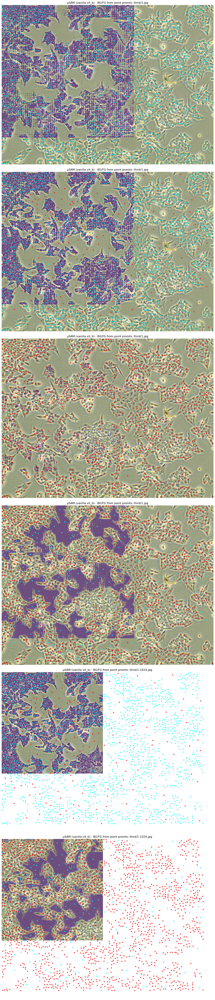

In [3]:

predictor = util.get_sam_model(model_type=model_type)

def doit(imgid, points, labels, ax):
  pImage = f"../data/{dataset_id}/{imgid}.jpg"
  pEmbed = f"{cache_dir}/embed/{imgid}-{model_type}.zarr"

  image = plt.imread(pImage)

  print('LOADING'  if os.path.exists(pEmbed) else
        'WRITING', f'embedding cache at {pEmbed}')

  embeddings = util.precompute_image_embeddings(
    predictor, image, ndim = 2, save_path=pEmbed,
    tile_shape=(tile:=1024, tile), halo=(halo:=tile//4, halo)
  )

  mask = micro_sam.prompt_based_segmentation.segment_from_points(
      predictor=predictor,
      image_embeddings=embeddings,
      points=points,
      labels=labels,
    )[0]

  ax.set_title(f"µSAM (vanilla {model_type}) - BG/FG from point promts: {dataset_id}/{imgid}.jpg")
  ax.axis('off')

  ax.imshow(skimage.color.label2rgb(
    mask, image, saturation=1, bg_color=None, alpha=0.5, colors=[[.25,0,.5]])
  )

  ax.scatter(points[:,1], points[:,0], c=['cyan' if l else 'red' for l in labels], s=10)

  return mask


fig, (a,b,c,d,e,f) = plt.subplots(6,1, figsize=(14, 10*6))
plt.tight_layout()

points_both = np.concatenate([points_fg, points_bg])
labels_both = np.concatenate([np.ones(len(points_fg)), np.zeros(len(points_bg))])

doit(1, points_fg, np.ones(len(points_fg)), a)
doit(1, points_fg, np.zeros(len(points_fg)), c)
doit(1, points_both, labels_both, b)
mask = doit(1, points_both, 1-labels_both, d)
doit('1-1024', points_both, labels_both, e)
doit('1-1024', points_both, 1-labels_both, f)


